In [1]:
import numpy as np
import pandas as pd
## Data Retrieval and Preprocessing
# Import required libraries
import pandas as pd
import numpy as np
import numpy.random as npr

import math
import scipy.stats as scs
import statsmodels.api as sm

# Import preprocessor from sklearn
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split

# Import from keras

%pip install tensorflow as tf

import datetime
from datetime import date



# Import cufflinks for visualization
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] =(20,10)
plt.style.use('fivethirtyeight')

# Ignore warnings
import warnings
warnings.filterwarnings('ignore')

Note: you may need to restart the kernel to use updated packages.


In [2]:
# Base Libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')

import datetime as dt
from pylab import mpl,plt

# Preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, GridSearchCV, TimeSeriesSplit, cross_val_score


# Classifier
from sklearn.neighbors import KNeighborsClassifier

# Metrics
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

import math

# Ignore warnings
import warnings
warnings.filterwarnings('ignore')

from sklearn.preprocessing import scale 
from sklearn import model_selection
from sklearn.linear_model import LinearRegression, Ridge, RidgeCV, Lasso, LassoCV
from sklearn.decomposition import PCA
from sklearn.cross_decomposition import PLSRegression
from sklearn.model_selection import KFold, cross_val_score
from sklearn.metrics import mean_squared_error

%matplotlib inline
plt.style.use('seaborn-white')

In [3]:
# Import from keras
%pip install keras==2.3.1
from keras.models import Sequential
from keras.utils.vis_utils import plot_model
from keras.layers import Dropout, Dense, LSTM


Note: you may need to restart the kernel to use updated packages.


Using TensorFlow backend.


In [53]:
data = pd.read_excel(r'C:\Users\Narendra.bande\Desktop\CQF material\Exam 3\Bande.NSE.xlsm', sheet_name='NSE')
data.columns = ['Time','Close','Open','High','Low','Daily return'] # Adj Close Price
data.info()
type(data)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048575 entries, 0 to 1048574
Data columns (total 6 columns):
Time            6312 non-null datetime64[ns]
Close           6312 non-null float64
Open            6312 non-null float64
High            6312 non-null float64
Low             6312 non-null float64
Daily return    6311 non-null float64
dtypes: datetime64[ns](1), float64(5)
memory usage: 48.0 MB


pandas.core.frame.DataFrame

In [54]:
data.tail(5)
nifty_close = data['Close']
nifty_open = data['Open']
nifty_high = data['High']
nifty_low = data['Low']

Text(0, 0.5, 'Nifty')

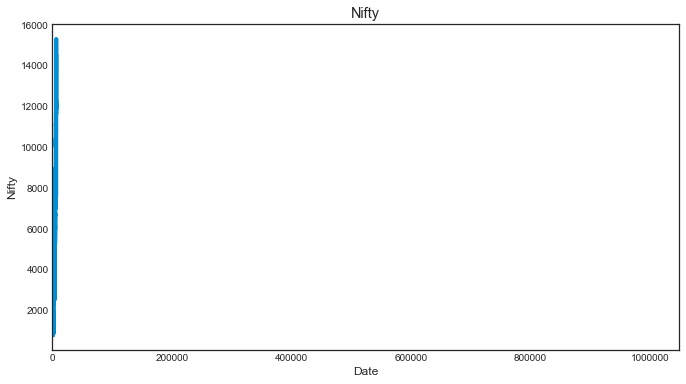

In [55]:
nifty_close.plot(figsize=(10, 6))
plt.title('Nifty')
plt.xlabel('Date')
plt.ylabel('Nifty')

In [7]:
#lags = 1

#cols = []
#for lag in range(1, lags+1):
    #col = 'ret_%d' % lag
    #data[col] = data_return.shift(lag)
    #cols.append(col)
    
# Column indexation is from 0, so we effectively have range(1, 6) for returns
# CHECK NOT TO USE Return IN ACTUAL PREDICTION

In [8]:
df = nifty_close.pct_change().fillna(0)
df

0          0.000000
1         -0.011080
2         -0.010820
3         -0.014526
4         -0.011348
             ...   
1048570    0.000000
1048571    0.000000
1048572    0.000000
1048573    0.000000
1048574    0.000000
Name: Close, Length: 1048575, dtype: float64

Text(0, 0.5, 'Nifty')

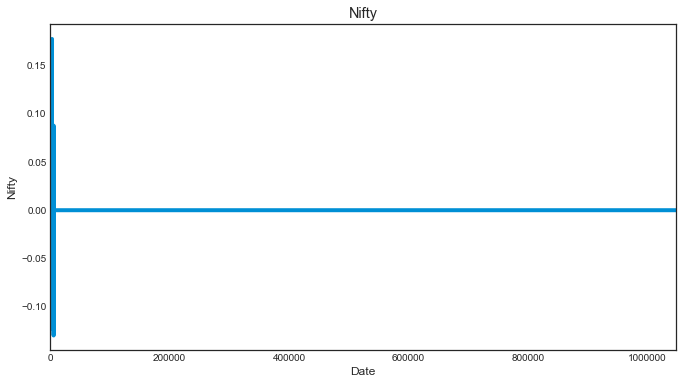

In [9]:
df.plot(figsize=(10, 6))
plt.title('Nifty')
plt.xlabel('Date')
plt.ylabel('Nifty')

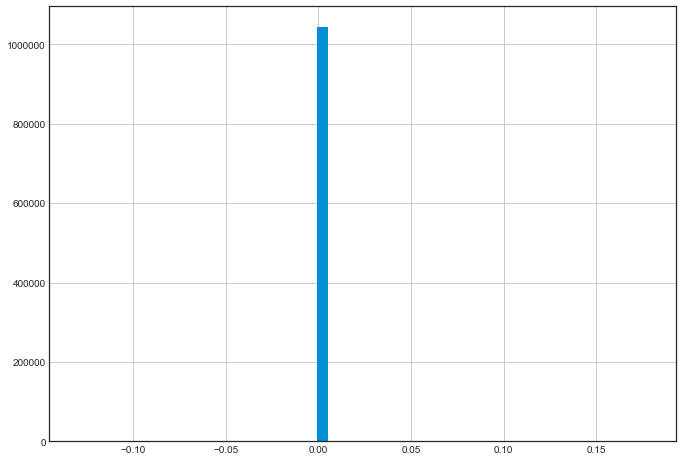

In [10]:
df.hist(bins=50, figsize=(10,8))

In [11]:
scs.describe(df)

DescribeResult(nobs=1048575, minmax=(-0.12980464127060365, 0.1774406601936458), mean=3.2366595783653427e-06, variance=1.3650726311677125e-06, skewness=0.4918858376001287, kurtosis=1946.0121032570044)

In [12]:
### Lets check the stats part

In [13]:
df.mean()

3.236659578365335e-06

In [14]:
df.std()

0.0011683632274538352

In [15]:
df = pd.DataFrame(df)

In [16]:
type(df)

pandas.core.frame.DataFrame

In [17]:
# Import cufflinks
import cufflinks as cf
cf.set_config_file(offline=True)

In [18]:
(df.mean()*252)


Close    0.000816
dtype: float64

In [19]:
math.sqrt(252)*df.std()

Close    0.018547
dtype: float64

In [20]:
# Plot log normal distribution of return
df.iplot(kind='histogram', title = 'Histogram of Daily Returns', subplots=True)


In [21]:
# Calculate minimum and maximum bin range
sr_min = np.min(df)
sr_max = np.max(df)
sr_min


Close   -0.129805
dtype: float64

In [22]:
sr_min

Close   -0.129805
dtype: float64

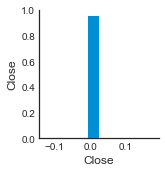

In [23]:
sns.pairplot(df)

In [24]:
# My forward plan:
#1st step
# Add indicators as following 
#1. 7/10 stochastic
# 2. ADX
# 3. Bollingr bands - Done
# 4. 100 day DMA
# 5. volume 



In [25]:
# 2nd step 
# add KNN/SVR
# make decision

In [26]:
## USE LSTM

In [27]:
## Try to predict option prices

In [28]:
# then create a back test environment and check for profit and loss

In [29]:
## Bollinger Bands

In [30]:
rolling_mean = nifty_close.rolling(20).mean(). fillna(0)
rolling_mean

0          0.0
1          0.0
2          0.0
3          0.0
4          0.0
          ... 
1048570    0.0
1048571    0.0
1048572    0.0
1048573    0.0
1048574    0.0
Name: Close, Length: 1048575, dtype: float64

In [31]:
 rolling_std = nifty_close.rolling(20).std().fillna(0)
rolling_std

0          0.0
1          0.0
2          0.0
3          0.0
4          0.0
          ... 
1048570    0.0
1048571    0.0
1048572    0.0
1048573    0.0
1048574    0.0
Name: Close, Length: 1048575, dtype: float64

In [32]:
df_Rolling_Mean = rolling_mean
df_Bollinger_High = rolling_mean + (rolling_std * 2)
df_Bollinger_Low = rolling_mean - (rolling_std * 2)

In [33]:
df_Rolling_Mean

0          0.0
1          0.0
2          0.0
3          0.0
4          0.0
          ... 
1048570    0.0
1048571    0.0
1048572    0.0
1048573    0.0
1048574    0.0
Name: Close, Length: 1048575, dtype: float64

In [34]:
df_Bollinger_High

0          0.0
1          0.0
2          0.0
3          0.0
4          0.0
          ... 
1048570    0.0
1048571    0.0
1048572    0.0
1048573    0.0
1048574    0.0
Name: Close, Length: 1048575, dtype: float64

In [35]:
df_Bollinger_Low

0          0.0
1          0.0
2          0.0
3          0.0
4          0.0
          ... 
1048570    0.0
1048571    0.0
1048572    0.0
1048573    0.0
1048574    0.0
Name: Close, Length: 1048575, dtype: float64

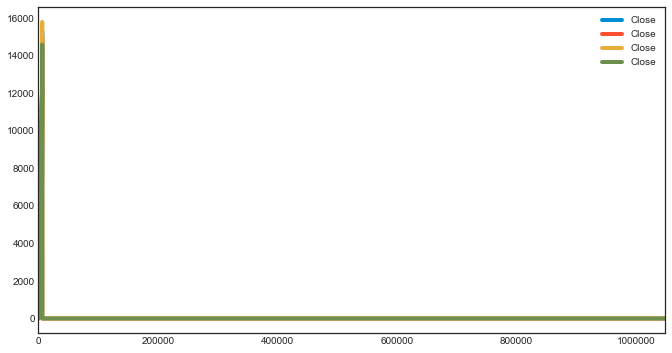

In [38]:
#df_close=data.head()
Rolling_Mean = pd.Series(df_Rolling_Mean)
BB_High = pd.Series(df_Bollinger_High)
BB_Low = pd.Series(df_Bollinger_Low)

type(data.head())
new_df = pd.to_numeric(nifty_close)
new_df.dtypes
new_df

New_DF = pd.concat([new_df,Rolling_Mean, BB_High, BB_Low], axis=1)

New_DF.plot(figsize=(10, 6))
#New_DF.to_excel('bollinger data.xls', index=False)

In [39]:
BB_DF = pd.concat([Rolling_Mean, BB_High, BB_Low], axis=1)
BB_DF

,Close,Close,Close
0,0.0,0.0,0.0
1,0.0,0.0,0.0
2,0.0,0.0,0.0
3,0.0,0.0,0.0
4,0.0,0.0,0.0
...,...,...,...
1048570,0.0,0.0,0.0
1048571,0.0,0.0,0.0
1048572,0.0,0.0,0.0
1048573,0.0,0.0,0.0


In [40]:
## Stochastic calculation

In [41]:
nifty_high
nifty_high

0          1000.91
1          1001.53
2           987.17
3           976.28
4           960.32
            ...   
1048570        NaN
1048571        NaN
1048572        NaN
1048573        NaN
1048574        NaN
Name: High, Length: 1048575, dtype: float64

In [42]:
type(nifty_open)

pandas.core.series.Series

In [43]:
nifty_close
(nifty_close)

0          1000.00
1           988.92
2           978.22
3           964.01
4           953.07
            ...   
1048570        NaN
1048571        NaN
1048572        NaN
1048573        NaN
1048574        NaN
Name: Close, Length: 1048575, dtype: float64

In [44]:
#Create the "L14" column in the DataFrame
nifty_L30 = nifty_low.rolling(window=30).min()
nifty_L30.fillna(0)
#Create the "H14" column in the DataFrame
nifty_H30 = nifty_high.rolling(window=30).max()
#Create the "%K" column in the DataFrame
nifty_K = 100*((nifty_close - nifty_L30)/(nifty_H30 - nifty_L30)).fillna(0)
nifty_K
# Create the %D column in the data frame
nifty_D = nifty_K.rolling(window=30).mean()


In [45]:
nifty_K

0          0.0
1          0.0
2          0.0
3          0.0
4          0.0
          ... 
1048570    0.0
1048571    0.0
1048572    0.0
1048573    0.0
1048574    0.0
Length: 1048575, dtype: float64

In [46]:
nifty_D

0                   NaN
1                   NaN
2                   NaN
3                   NaN
4                   NaN
               ...     
1048570    2.723747e-14
1048571    2.723747e-14
1048572    2.723747e-14
1048573    2.723747e-14
1048574    2.723747e-14
Length: 1048575, dtype: float64

In [48]:
df_stoc = pd.DataFrame(np.column_stack((nifty_K, nifty_D)))
#df_stoc.to_excel('stochastic.xls', index=False)
df_stoc

,0,1
0,0.0,NaN
1,0.0,NaN
2,0.0,NaN
3,0.0,NaN
4,0.0,NaN
...,...,...
1048570,0.0,2.723747e-14
1048571,0.0,2.723747e-14
1048572,0.0,2.723747e-14
1048573,0.0,2.723747e-14


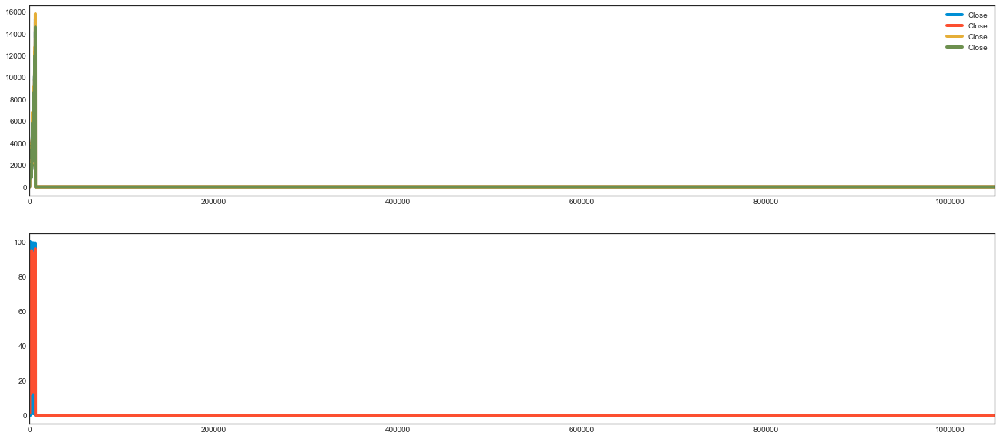

In [49]:
fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(20,10))

New_DF.plot(ax=axes[0]); axes[0]
nifty_K.plot(ax=axes[1]); axes[1]
nifty_D.plot(ax=axes[1]); axes[1]

In [50]:
## 100 DMA 

In [51]:
short_rolling = new_df.rolling(window=100).mean().fillna(0)
short_rolling.tail(5)


1048570    0.0
1048571    0.0
1048572    0.0
1048573    0.0
1048574    0.0
Name: Close, dtype: float64

In [52]:
type(new_df)
type(short_rolling)
df_100DMA = pd.DataFrame(np.column_stack((short_rolling, nifty_close)))
df_100DMA.to_excel('100DMA.xls', index=False)


ValueError: row index was 65536, not allowed by .xls format

In [ ]:


fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(20,10))

new_df.plot(ax=axes[0]); axes[0]
short_rolling.plot(ax=axes[0]); axes[1]


In [ ]:
#######
"""
The trading signal will be combination of following indicators as follows
1. Buy Calls signal 
A. as the daily close is above the 100DMA,
B. The daily close is just above the lower BB
C. The stochastic is above 40

2. Buy Put Signal
When there is no buy signal, buy put for safety. 
"""

In [ ]:
### Create signals

In [ ]:
buy1 = pd.DataFrame(np.where(short_rolling >= nifty_close, 1.0,-1.0).reshape(-1,1))
(buy1)


In [ ]:
buy2 = pd.DataFrame(np.where(BB_Low >= nifty_close, 1.0,-1.0).reshape(-1,1))
buy2.shape


In [ ]:
buy3 = pd.DataFrame(np.where(((nifty_K>=40) & (nifty_K>=nifty_D)), 1.0,-1.0).reshape(-1,1))
buy3.shape


In [ ]:
buyscreen1 = pd.DataFrame(np.where((buy1>=buy2),1.0,-1.0))
buyscreen1

In [ ]:
buyscreen2 = pd.DataFrame(np.where((buy2>=buy3), 1.0,-1.0))
buyscreen2


In [ ]:
buyscreener = pd.DataFrame(np.where((buyscreen1 >= buyscreen2), 1,-1))
buyscreener.shape
new_buyscreen = np.column_stack((nifty_close, buyscreener))
new_buyscreen.shape

In [ ]:
#buyscreener.to_excel('buyscreener.xls')

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(20,10))

buyscreener.plot(ax=axes[0]); axes[0]
nifty_close.plot(ax=axes[1]); axes[1]


In [ ]:

buy_array = np.column_stack((buy1, buy2, buy3))
type(buy_array)
signaldf = pd.DataFrame(buy_array, columns=['Above 100DMA', 'Above Lower BB', 'Overbought'])
signaldf.tail(30)

In [62]:
## In Above row, I am compiling all signals into a single data frame. 

In [63]:
### Implementing LSTM on indicators

In [64]:
model_one = Sequential()
model_one.add(LSTM(50, activation='relu', input_shape=(1,1)))
model_one.add(Dense(1))
model_one.compile(optimizer='adam', loss='mse')
print(model_one.summary())

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 50)                10400     
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 51        
Total params: 10,451
Trainable params: 10,451
Non-trainable params: 0
_________________________________________________________________
None


In [65]:
# Splitting the datasets into training and testing data.
train_buy, test_buy = train_test_split(buyscreener, train_size=0.8, test_size=0.2, shuffle=False)

# Output the train and test data size
print(f"Train and Test Size {len(train_buy)}, {len(test_buy)}")

Train and Test Size 5036, 1259


In [66]:


# Scale the features MinMax for training and test datasets
scaler = MinMaxScaler()
scaled_train_data = scaler.fit_transform(train_buy)
scaled_test_data = scaler.transform(test_buy)

scaled_train_data

array([[1.],
       [1.],
       [1.],
       ...,
       [1.],
       [1.],
       [1.]])

In [67]:
# create X & y data array
X_train = []
y_train = []
timesteps = 60

for i in range(timesteps, len(scaled_train_data)):
    X_train.append(scaled_train_data[i-timesteps:i,0])
    y_train.append(scaled_train_data[i,0])

# Converting x_train and y_train to Numpy arrays
X_train, y_train = np.array(X_train), np.array(y_train)
print(f'X_train: {X_train.shape}, y_train {y_train.shape}')


X_train: (4976, 60), y_train (4976,)


In [68]:
## Reshape the data

In [69]:
# reshaping into 3D Array
X_train = np.reshape(X_train,(X_train.shape[0], X_train.shape[1], 1))

# check the array size
X_train.shape

(4976, 60, 1)

In [70]:
y_train.shape

(4976,)

In [71]:
X_train

array([[[1.],
        [1.],
        [1.],
        ...,
        [1.],
        [1.],
        [1.]],

       [[1.],
        [1.],
        [1.],
        ...,
        [1.],
        [1.],
        [1.]],

       [[1.],
        [1.],
        [1.],
        ...,
        [1.],
        [1.],
        [1.]],

       ...,

       [[1.],
        [1.],
        [1.],
        ...,
        [1.],
        [1.],
        [1.]],

       [[1.],
        [1.],
        [1.],
        ...,
        [1.],
        [1.],
        [1.]],

       [[1.],
        [1.],
        [1.],
        ...,
        [1.],
        [1.],
        [1.]]])

In [72]:
X_train[0]

array([[1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.]])

In [73]:
len(X_train[0])

60

In [74]:
## Building LSTM Model

In [75]:
# Instantiate the Sequential Model
model = Sequential()

# Add first layer with dropout regularisation with 100 neurons and inputs shape for 1st set
model.add(LSTM(units=256, input_shape = (X_train.shape[1],X_train.shape[2]), return_sequences=True)) 
model.add(Dropout(0.4))

# Add second layer with dropout
model.add(LSTM(units=256, return_sequences=False))
model.add(Dropout(0.4))

# Add a Dense layer
model.add(Dense(64,  activation = 'relu'))

# Add the output layer
model.add(Dense(1))

# Print model summary
print(model.summary())

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_2 (LSTM)                (None, 60, 256)           264192    
_________________________________________________________________
dropout_1 (Dropout)          (None, 60, 256)           0         
_________________________________________________________________
lstm_3 (LSTM)                (None, 256)               525312    
_________________________________________________________________
dropout_2 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 64)                16448     
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 65        
Total params: 806,017
Trainable params: 806,017
Non-trainable params: 0
________________________________________________

In [76]:
# Get model weights
for lay in model.layers:
    print(lay.name)
    print(lay.get_weights())

lstm_2
[array([[-0.0085496 ,  0.01982131,  0.06644693, ...,  0.0350019 ,
        -0.0334771 , -0.03626664]], dtype=float32), array([[-0.0015663 ,  0.05941846,  0.0085299 , ..., -0.04265438,
        -0.05406045,  0.00291621],
       [-0.03795046, -0.01383537,  0.04642816, ..., -0.02441113,
         0.00446083, -0.04130632],
       [ 0.01716858,  0.0312087 ,  0.01833683, ..., -0.04756247,
         0.01771532, -0.0680042 ],
       ...,
       [ 0.05552945,  0.02302489, -0.02460844, ..., -0.02102369,
        -0.00053959,  0.02923696],
       [ 0.00237158,  0.02341653, -0.01666818, ...,  0.02904289,
        -0.031455  , -0.00255819],
       [-0.04044824,  0.0200028 , -0.03122325, ..., -0.01400347,
        -0.0142607 , -0.01117183]], dtype=float32), array([0., 0., 0., ..., 0., 0., 0.], dtype=float32)]
dropout_1
[]
lstm_3
[array([[-0.03341283,  0.01495717,  0.03953362, ..., -0.06530217,
        -0.05033681, -0.00108758],
       [ 0.02503491, -0.03792152,  0.06345282, ..., -0.02867356,
       

In [77]:
## Compiling model

In [78]:
# Compiling the model
model.compile(optimizer='adam', loss='mean_squared_error')

In [79]:
### Fitting the model

In [80]:
# Training the model to the training dataset
history = model.fit(X_train, y_train, batch_size=64, epochs=20, verbose=1, validation_split=0.05, shuffle=False)

Train on 4727 samples, validate on 249 samples
Epoch 1/20
4727/4727 [==============================] - 46s 10ms/step - loss: 0.0461 - val_loss: 1.5686e-04
Epoch 2/20
4727/4727 [==============================] - 70s 15ms/step - loss: 0.0175 - val_loss: 0.0029
Epoch 3/20
4727/4727 [==============================] - 71s 15ms/step - loss: 0.0157 - val_loss: 0.0019
Epoch 4/20
4727/4727 [==============================] - 81s 17ms/step - loss: 0.0160 - val_loss: 0.0018
Epoch 5/20
4727/4727 [==============================] - 77s 16ms/step - loss: 0.0148 - val_loss: 0.0039
Epoch 6/20
4727/4727 [==============================] - 86s 18ms/step - loss: 0.0148 - val_loss: 0.0012
Epoch 7/20
4727/4727 [==============================] - 80s 17ms/step - loss: 0.0142 - val_loss: 0.0010
Epoch 8/20
4727/4727 [==============================] - 85s 18ms/step - loss: 0.0143 - val_loss: 0.0031
Epoch 9/20
4727/4727 [==============================] - 87s 18ms/step - loss: 0.0144 - val_loss: 0.0019
Epoch 10/20
4

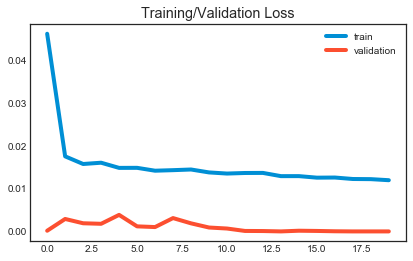

In [110]:
# Visualize the training and validation loss
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='validation')
plt.legend()
plt.title('Training/Validation Loss');

In [111]:
print(f'{model.metrics_names}: {model.evaluate(X_train, y_train , verbose=1)}')

4976/4976 [==============================] - 16s 3ms/step
['loss']: 0.010530721937492412


In [112]:
# Building the array
X_test = []
y_test = test_buy[60:]
timesteps = 60

for i in range(timesteps, len(scaled_test_data)):
    X_test.append(scaled_test_data[i-timesteps:i,0])

# Converting x_train and y_train to Numpy arrays
X_test = np.array(X_test)

# Reshaping into 3D Array
X_test = np.reshape(X_test,(X_test.shape[0], X_test.shape[1], 1))

# Check the array size
X_test.shape

(1199, 60, 1)

In [113]:
# Scale the data by transforming
y_pred = model.predict(X_test)
predicted_signal = scaler.inverse_transform(y_pred)
predicted_signal

array([[0.99724436],
       [0.99724436],
       [0.99724436],
       ...,
       [0.9960798 ],
       [0.99630344],
       [0.9964957 ]], dtype=float32)

In [114]:
type(y_pred)
#pd.DataFrame(y_pred).to_csv('y_pred')

numpy.ndarray

In [115]:
y_test.tail(60)


,0
6235,1
6236,1
6237,1
6238,1
6239,1
6240,1
6241,1
6242,1
6243,1
6244,1


In [116]:
rmse = np.sqrt(np.mean(predicted_signal - y_test)**2)
rmse

0    0.021684
dtype: float64

In [117]:
accuracy_score(y_test.round(), y_pred.round())

0.9841534612176814

No handles with labels found to put in legend.


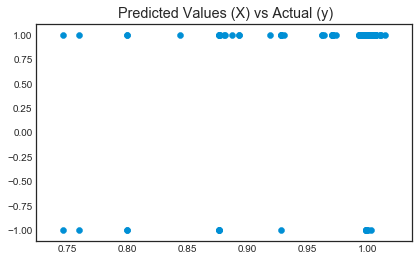

In [118]:
# Plot prediction vs actual price
plt.figure(2)
plt.scatter(y_pred, y_test)

plt.legend()
plt.title(' Predicted Values (X) vs Actual (y)');

Text(0.5, 1.0, 'Predicted value vs Actual Values')

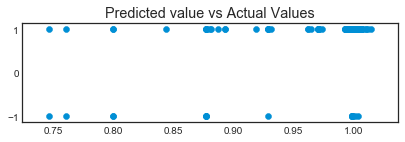

In [119]:
plt.figure(1)
plt.subplot(2,1,1)
plt.scatter(y_pred, y_test)
plt.title('Predicted value vs Actual Values')

In [120]:
##### Comparing results with SVR method

In [121]:
new_buyscreen = np.column_stack((nifty_close, buyscreener))
new_buyscreen

array([[1.000000e+03, 1.000000e+00],
       [9.889200e+02, 1.000000e+00],
       [9.782200e+02, 1.000000e+00],
       ...,
       [1.498200e+04, 1.000000e+00],
       [1.509735e+04, 1.000000e+00],
       [1.452900e+04, 1.000000e+00]])

In [122]:
# Preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split

# SVM
from sklearn.svm import SVC, SVR

# Metrics
from sklearn.metrics import  r2_score, mean_squared_error, mean_absolute_error


In [123]:
### Split data

In [124]:
# Splitting the datasets into training and testing data.
SVR_train, SVR_test, SVR_train, SVR_test = train_test_split(df,buyscreener, test_size=0.2, random_state=0, shuffle=False)

# Output the train and test data size
print(f"Train and Test Size {len(SVR_train)}, {len(SVR_test)}")

Train and Test Size 5036, 1259


In [125]:
### Fitting Model

In [126]:
# Scale and fit the model using pipeline
# pipe = Pipeline([("scaler", StandardScaler()), ("regressor", SVR(C=1, gamma='auto', kernel='linear'))]) 

pipe = Pipeline([("scaler", StandardScaler()), ("regressor", SVR(kernel='rbf', C=1e3, gamma=0.1))]) 
pipe.fit(SVR_train, SVR_train)

Pipeline(memory=None,
         steps=[('scaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('regressor',
                 SVR(C=1000.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1,
                     gamma=0.1, kernel='rbf', max_iter=-1, shrinking=True,
                     tol=0.001, verbose=False))],
         verbose=False)

In [127]:
### Predict Model

In [128]:
### Predicting the test dataset
SVR_pred = pipe.predict(SVR_test)
SVR_pred[5:]

array([0.9, 0.9, 0.9, ..., 0.9, 0.9, 0.9])

In [129]:
# Metrics 
pipe.score(SVR_test,SVR_pred) # r2_score(y_test,y_pred)

1.0

In [130]:
# Output prediction scoare
print(f'Train Accuracy: {pipe.score(SVR_train,SVR_train):0.4}')
print(f'Test Accuracy: {pipe.score(SVR_test,SVR_test):0.4}')

Train Accuracy: 0.7804
Test Accuracy: 0.8318


In [131]:
### Visualize

In [132]:
SVR_test.tail(30)

,0
6265,1
6266,1
6267,1
6268,1
6269,1
6270,1
6271,1
6272,1
6273,1
6274,-1


In [133]:
SVR_test.shape
SVR_test.append
np.asarray(SVR_test)

array([[1],
       [1],
       [1],
       ...,
       [1],
       [1],
       [1]])

In [134]:
SVR_test
np.asarray(SVR_test)
SVR_test

,0
5036,1
5037,1
5038,1
5039,1
5040,1
...,...
6290,1
6291,1
6292,1
6293,1


In [135]:
SVR_pred
pd.DataFrame(SVR_pred)
SVR_pred

array([0.9, 0.9, 0.9, ..., 0.9, 0.9, 0.9])

In [136]:
# Create a dataframe to subsume key values
df3 = np.column_stack((SVR_test, SVR_pred))
type(df3)
df3.tolist()


[[1.0, 0.8999999999948065],
 [1.0, 0.8999999999948065],
 [1.0, 0.8999999999948065],
 [1.0, 0.8999999999948065],
 [1.0, 0.8999999999948065],
 [1.0, 0.8999999999948065],
 [1.0, 0.8999999999948065],
 [1.0, 0.8999999999948065],
 [1.0, 0.8999999999948065],
 [1.0, 0.8999999999948065],
 [1.0, 0.8999999999948065],
 [1.0, 0.8999999999948065],
 [1.0, 0.8999999999948065],
 [1.0, 0.8999999999948065],
 [1.0, 0.8999999999948065],
 [1.0, 0.8999999999948065],
 [1.0, 0.8999999999948065],
 [1.0, 0.8999999999948065],
 [1.0, 0.8999999999948065],
 [1.0, 0.8999999999948065],
 [1.0, 0.8999999999948065],
 [1.0, 0.8999999999948065],
 [1.0, 0.8999999999948065],
 [1.0, 0.8999999999948065],
 [1.0, 0.8999999999948065],
 [1.0, 0.8999999999948065],
 [1.0, 0.8999999999948065],
 [1.0, 0.8999999999948065],
 [1.0, 0.8999999999948065],
 [1.0, 0.8999999999948065],
 [1.0, 0.8999999999948065],
 [1.0, 0.8999999999948065],
 [1.0, 0.8999999999948065],
 [1.0, 0.8999999999948065],
 [1.0, 0.8999999999948065],
 [1.0, 0.89999999999

In [213]:
#pd.DataFrame(df3).to_csv('SVR output')

In [138]:
# get the accuracy
accuracy_score(SVR_test.round(), SVR_pred.round(),normalize=False)

1259

In [139]:
np.mean(df3)

0.9213264495606269

Text(0.5, 1.0, 'Predicted signal')

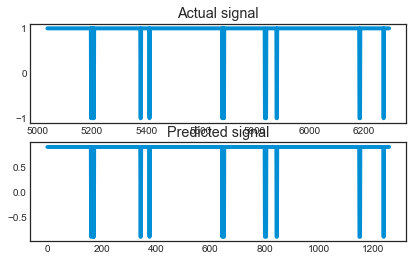

In [140]:
plt.subplot(2,1,1)
plt.plot(SVR_test)
plt.title('Actual signal')
plt.subplot(2,1,2)
plt.plot(SVR_pred)
plt.title('Predicted signal')

In [141]:
## Comapring with MLP classifier

In [142]:
type(buyscreener)
buyscreener.to_numpy()

array([[1],
       [1],
       [1],
       ...,
       [1],
       [1],
       [1]])

In [143]:
type(nifty_close)
#nifty_close.astype(float)
#new_nifty = nifty_close[:]
#new_nifty
new_nifty = nifty_close.to_numpy()
new_nifty.reshape(-1,1)

array([[ 1000.  ],
       [  988.92],
       [  978.22],
       ...,
       [14982.  ],
       [15097.35],
       [14529.  ]])

In [144]:
# Preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, GridSearchCV, TimeSeriesSplit, cross_val_score

# Classifier
from sklearn.neighbors import KNeighborsClassifier

# Metrics
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix


In [145]:
nifty_close[5:]

5         948.82
6         917.26
7         902.56
8         913.21
9         904.08
          ...   
6290    14675.70
6291    14707.80
6292    14982.00
6293    15097.35
6294    14529.00
Name: Close, Length: 6290, dtype: float64

In [146]:
from sklearn import preprocessing

In [147]:
new_nifty[:5]
new_nifty

array([ 1000.  ,   988.92,   978.22, ..., 14982.  , 15097.35, 14529.  ])

In [148]:
buyscreener[5:]

,0
5,1
6,1
7,1
8,1
9,1
...,...
6290,1
6291,1
6292,1
6293,1


In [149]:
import sklearn.neural_network
from sklearn.neural_network import MLPClassifier

In [150]:
model = MLPClassifier(solver = 'lbfgs', alpha=1e-5, hidden_layer_sizes=2*[75], random_state=10)

In [151]:
%time model.fit(df, buyscreener)

Wall time: 2.59 s


MLPClassifier(activation='relu', alpha=1e-05, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=[75, 75], learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=10, shuffle=True, solver='lbfgs', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)

In [152]:
MLP_pred = model.predict(df)
MLP_pred

array([1, 1, 1, ..., 1, 1, 1])

In [153]:
accuracy_score(buyscreener, MLP_pred)

0.9877680698967435

Text(0.5, 1.0, 'MLP signal')

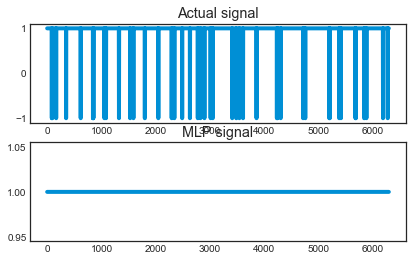

In [154]:
plt.subplot(2,1,1)
plt.plot(buyscreener)
plt.title('Actual signal')
plt.subplot(2,1,2)
plt.plot(MLP_pred)
plt.title('MLP signal')

In [155]:
df4 =  np.column_stack((buyscreener, MLP_pred))
df4.tolist()
df4 = pd.DataFrame(df4)
#df4.to_excel('MLP output.xls', index=False)

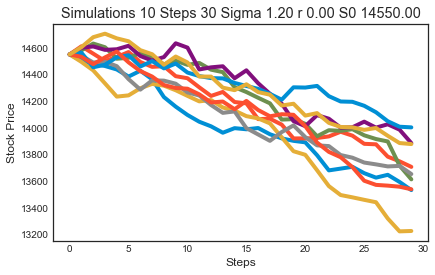

In [60]:
S0 = 14550 #initial stock price
K = 14000 #strike price
r = 0.0035 #risk-free interest rate
sigma = 1.20#volatility in market
T = (30/365) #time in years
N = 30 #number of steps within each simulation
deltat = T/N #time step
i = 10 #number of simulations
discount_factor = np.exp(-r*T) #discount factor

S = np.zeros([i,N])
t = range(0,N,1)



for y in range(0,i-1):
    S[y,0]=S0
    for x in range(0,N-1):
        S[y,x+1] = S[y,x]*(np.exp((r-(sigma**2)/2)*deltat + sigma*deltat*np.random.normal(0,1)))
    plt.plot(t,S[y])

plt.title('Simulations %d Steps %d Sigma %.2f r %.2f S0 %.2f' % (i, N, sigma, r, S0))
plt.xlabel('Steps')
plt.ylabel('Stock Price')
plt.show()

In [157]:
## Jump diffusion

In [67]:
S0 = 14560
r = 0.035
sigma = 0.802
lamb = 0.01
mu = 0.000541
delta=0.025
rj = lamb*(math.exp(mu + 0.5*delta**2)-1)

In [68]:
T = 1/12
M = 50
I = 10000
dt = T/M

In [69]:
S = np.zeros((M+1,I))
S[0] = S0
sn1 = npr.standard_normal((M+1,I))
sn2 = npr.standard_normal((M+1, I))
poi = npr.poisson(lamb*dt, (M+1,I))
for t in range(1, M+1, 1):
    S[t] = S[t-1] * (np.exp((r-rj-0.5*sigma**2)*dt+
                           sigma* math.sqrt(dt) * sn1[t]) + 
                    (np.exp(mu + delta * sn2[t])-1)*
                    poi[t])
    S[t] = np.maximum(S[t], 0)

In [70]:
S

array([[14560.        , 14560.        , 14560.        , ...,
        14560.        , 14560.        , 14560.        ],
       [15277.20507756, 14659.2915577 , 15073.00654384, ...,
        14524.39202353, 14711.6235399 , 15604.9888671 ],
       [15667.23977504, 14859.54311965, 15604.9396778 , ...,
        14319.95955664, 14457.24137932, 15736.73137039],
       ...,
       [12276.42958432, 20696.55594415, 13846.28504174, ...,
        12746.9262092 , 14077.89651655, 10877.25435247],
       [12240.54552262, 19985.31862466, 14164.78438939, ...,
        12865.38664093, 14227.74727465, 10174.06052673],
       [12807.39667533, 20386.59481406, 15152.29189435, ...,
        13016.65107378, 14218.12771351, 10100.81850483]])

Text(0, 0.5, 'frequency')

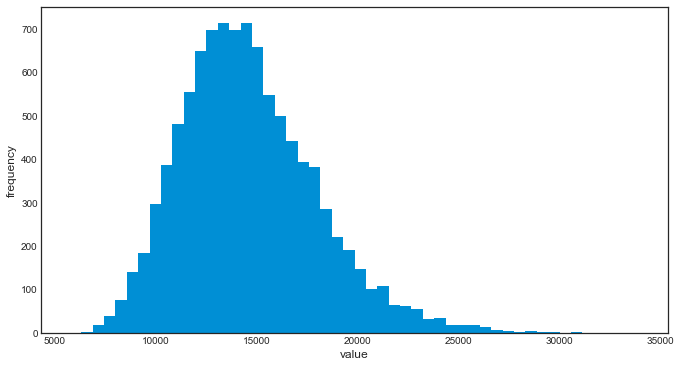

In [71]:
plt.figure(figsize=(10,6))
plt.hist(S[-1], bins=50)
plt.xlabel('value')
plt.ylabel('frequency')

Text(0, 0.5, 'index level')

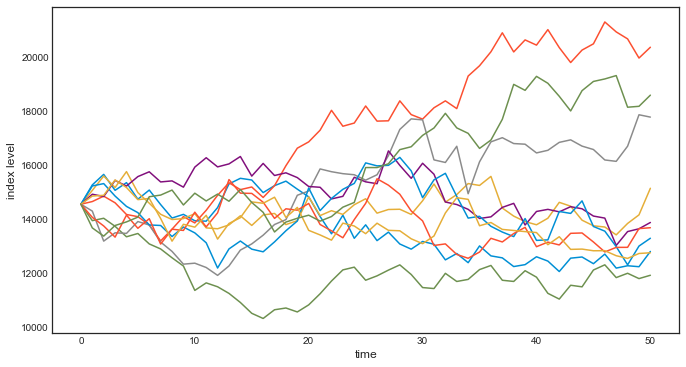

In [72]:
plt.figure(figsize=(10,6))
plt.plot(S[:,:10], lw=1.5)
plt.xlabel('time')
plt.ylabel('index level')

In [73]:
## So at this point, we know as per indicators, market is in buy position and we have marked the football field as in the expected upper and lower range of the market. 
### Without jump - High 15000, Low - 13800 for next 6 months.
### Using jump diffusion - High - 20000 and Low - 11000 for next months. 

In [74]:
####Lets do the option pricing for same time period.

import pandas as pd
import numpy as np
from numpy import *
from scipy.stats import norm

import matplotlib.pyplot as plt
from tabulate import tabulate

In [75]:
class BS:
    
    """
    This is a class for Options contract for pricing European options on stocks without dividends.
    
    Attributes: 
        spot          : int or float
        strike        : int or float 
        rate          : float
        dte           : int or float [days to expiration in number of years]
        volatility    : float
    """    
    
    def __init__(self, spot, strike, rate, dte, volatility):
        
        # Spot Price
        self.spot = spot
        
        # Option Strike
        self.strike = strike
        
        # Interest Rate
        self.rate = rate
        
        # Days To Expiration
        self.dte = dte
        
        # Volaitlity
        self.volatility = volatility
       
        # Utility 
        self._a_ = self.volatility * self.dte**0.5
        
        if self.strike == 0:
            raise ZeroDivisionError('The strike price cannot be zero')
        else:
            self._d1_ = (log(self.spot / self.strike) + \
                     (self.rate + (self.volatility**2) / 2) * self.dte) / self._a_
        
        self._d2_ = self._d1_ - self._a_
        
        self._b_ = e**-(self.rate * self.dte)
        
        
        # The __dict__ attribute
        '''
        Contains all the attributes defined for the object itself. It maps the attribute name to its value.
        '''
        for i in ['callPrice', 'putPrice', 'callDelta', 'putDelta', 'callTheta', 'putTheta', \
                  'callRho', 'putRho', 'vega', 'gamma']:
            self.__dict__[i] = None
        
        [self.callPrice, self.putPrice] = self._price()
        [self.callDelta, self.putDelta] = self._delta()
        [self.callTheta, self.putTheta] = self._theta()
        [self.callRho, self.putRho] = self._rho()
        self.vega = self._vega()
        self.gamma = self._gamma()
        
    
    # Option Price
    def _price(self):
        '''Returns the option price: [Call price, Put price]'''

        if self.volatility == 0 or self.dte == 0:
            call = maximum(0.0, self.spot - self.strike)
            put = maximum(0.0, self.strike - self.spot)
        else:
            call = self.spot * norm.cdf(self._d1_) - self.strike * e**(-self.rate * \
                                                                       self.dte) * norm.cdf(self._d2_)

            put = self.strike * e**(-self.rate * self.dte) * norm.cdf(-self._d2_) - \
                                                                        self.spot * norm.cdf(-self._d1_)
        return [call, put]

    # Option Delta
    def _delta(self):
        '''Returns the option delta: [Call delta, Put delta]'''

        if self.volatility == 0 or self.dte == 0:
            call = 1.0 if self.spot > self.strike else 0.0
            put = -1.0 if self.spot < self.strike else 0.0
        else:
            call = norm.cdf(self._d1_)
            put = -norm.cdf(-self._d1_)
        return [call, put]

    # Option Gamma
    def _gamma(self):
        '''Returns the option gamma'''
        return norm.pdf(self._d1_) / (self.spot * self._a_)

    # Option Vega
    def _vega(self):
        '''Returns the option vega'''
        if self.volatility == 0 or self.dte == 0:
            return 0.0
        else:
            return self.spot * norm.pdf(self._d1_) * self.dte**0.5 / 100

    # Option Theta
    def _theta(self):
        '''Returns the option theta: [Call theta, Put theta]'''
        call = -self.spot * norm.pdf(self._d1_) * self.volatility / (2 * self.dte**0.5) - self.rate * self.strike * self._b_ * norm.cdf(self._d2_)

        put = -self.spot * norm.pdf(self._d1_) * self.volatility / (2 * self.dte**0.5) + self.rate * self.strike * self._b_ * norm.cdf(-self._d2_)
        return [call / 365, put / 365]

    # Option Rho
    def _rho(self):
        '''Returns the option rho: [Call rho, Put rho]'''
        call = self.strike * self.dte * self._b_ * norm.cdf(self._d2_) / 100
        put = -self.strike * self.dte * self._b_ * norm.cdf(-self._d2_) / 100

        return [call, put]
    
    

In [76]:
S  = 14550
K = 14500
r = 0.0345
σ = 0.80
t = 25/365

In [81]:
# Initialize option
option = BS(14400,14000,0.0345,7/365,0.29)

header = ['Option Price', 'Delta', 'Gamma', 'Theta', 'Vega', 'Rho']
table = [[option.callPrice, option.callDelta, option.gamma, option.callTheta, option.vega, option.callRho]]

print(tabulate(table,header))

  Option Price     Delta        Gamma     Theta     Vega      Rho
--------------  --------  -----------  --------  -------  -------
       488.253  0.769746  0.000525383  -13.5524  6.05904  2.03213


In [169]:
## Lets use put call parity to find put price

In [82]:
S = 14400
K = 14000 #Actual price
r = 0.0345
t = 7/365
C = 488


In [88]:
P = C - S-(K*exp(-r*t))

P = 488 - (14400-(14000*exp(-0.0345*(7/365))))
P

78.74005003358798

In [91]:
C =  S-(K*exp(-r*t)) + P

C = (14400-(14000*exp(-0.0345*(10/365)))) + 78
C

491.22662478847997